In [2]:
#!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cpu
!pip install shap
!pip install branca
!pip install folium
!pip install matplotlib
!pip install mapclassify
#

ERROR: Could not install packages due to an OSError: Could not find a suitable TLS CA certificate bundle, invalid path: C:\Program Files\PostgreSQL\18\ssl\certs\ca-bundle.crt



In [3]:
import geopandas as gpd

final_data=gpd.read_file('D:/3A ENSAE/Machine Learning for climate risk/Project/Clean_Bases/final_data_20_24.gpkg')

final_data.head(3)

,SWI_UNIF_MENS,ym,swi_min,swi_mean,swi_max,prenei_sum,preliq_sum,pe_sum,evap_sum,t_avg,...,nom_officiel_en_majuscules,numero_du_canton,code_insee,codes_insee_des_arrondissements,code_insee_du_departement,code_insee_de_la_region,composition_du_canton,dept_name,region_name,geometry
0,0.949,2020-01,0.861,0.90229,0.956,0.0,48.2,29.5,18.7,7.225806,...,DUNKERQUE-2,17,5917,594,59,32,Fraction d'une commune et de commune(s) entièr...,Nord,Hauts-de-France,POINT (665362 7106108)
1,0.957,2020-01,0.858,0.90429,0.956,0.0,45.3,24.5,20.8,7.319355,...,MARCK,34,6234,626,62,32,Commune(s) entière(s),Pas-de-Calais,Hauts-de-France,POINT (625315 7098447)
2,0.957,2020-01,0.857,0.90400,0.956,0.0,45.3,24.8,20.5,7.319355,...,MARCK,34,6234,626,62,32,Commune(s) entière(s),Pas-de-Calais,Hauts-de-France,POINT (633311 7098380)


In [4]:
final_data.columns

Index(['SWI_UNIF_MENS', 'ym', 'swi_min', 'swi_mean', 'swi_max', 'prenei_sum',
       'preliq_sum', 'pe_sum', 'evap_sum', 't_avg', 'ff_avg', 'q_avg',
       'hu_avg', 'dli_avg', 'ssi_avg', 'etp_avg', 'tinf_avg', 'tsup_avg',
       'resr_neige_avg', 'resr_neige6_avg', 'hteurneige_avg',
       'hteurneige6_avg', 'hteurneigex_avg', 'snow_frac_avg', 'drainc_sum',
       'runc_sum', 'ecoulement_sum', 'wg_racine_avg', 'wgi_racine_avg', 'ALEA',
       'NIVEAU', 'index__adm', 'cleabs', 'nom_officiel',
       'nom_officiel_en_majuscules', 'numero_du_canton', 'code_insee',
       'codes_insee_des_arrondissements', 'code_insee_du_departement',
       'code_insee_de_la_region', 'composition_du_canton', 'dept_name',
       'region_name', 'geometry'],
      dtype='object')

In [5]:
import random
import numpy as np
import torch

SEED = 42  # you can pick any number

# Python random
random.seed(SEED)

# NumPy
np.random.seed(SEED)

# PyTorch
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)  # if multiple GPUs

# Optional: deterministic behavior
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


In [6]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
import numpy as np

# Variables dynamiques
dyn_vars = ['swi_min','swi_mean','swi_max','prenei_sum','preliq_sum','pe_sum',
            'evap_sum','t_avg','ff_avg','q_avg','hu_avg','dli_avg','ssi_avg',
            'etp_avg','tinf_avg','tsup_avg','resr_neige_avg','resr_neige6_avg',
            'hteurneige_avg','hteurneige6_avg','hteurneigex_avg','snow_frac_avg',
            'drainc_sum','runc_sum','ecoulement_sum','wg_racine_avg','wgi_racine_avg']

X_dyn = final_data[dyn_vars].values
scaler_dyn = StandardScaler()
X_dyn_scaled = scaler_dyn.fit_transform(X_dyn)

# Variables statiques
X_stat_num = final_data[['NIVEAU']].values
scaler_stat = StandardScaler()
X_stat_num_scaled = scaler_stat.fit_transform(X_stat_num)

X_stat_cat = final_data[['region_name']]
ohe = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
X_stat_cat_enc = ohe.fit_transform(X_stat_cat)

X_stat_final = np.hstack([X_stat_num_scaled, X_stat_cat_enc])

# Cible
y = final_data['SWI_UNIF_MENS'].values


Créer un dataset pytorch

In [7]:
import torch
from torch.utils.data import Dataset, DataLoader

class SWIDataset(Dataset):
    def __init__(self, X_dyn, X_stat, y):
        self.X_dyn = torch.tensor(X_dyn, dtype=torch.float32)
        self.X_stat = torch.tensor(X_stat, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.float32).unsqueeze(1)

    def __len__(self):
        return len(self.y)

    def __getitem__(self, idx):
        return self.X_dyn[idx], self.X_stat[idx], self.y[idx]


Construire le MPL à deux entrées

In [8]:
import torch.nn as nn

class MLP(nn.Module):
    def __init__(self, N_dyn, N_stat):
        super().__init__()
        # Branche dynamique
        self.dyn_branch = nn.Sequential(
            nn.Linear(N_dyn, 64),
            nn.ReLU(),
            nn.Linear(64, 32),
            nn.ReLU()
        )
        # Branche statique
        self.stat_branch = nn.Sequential(
            nn.Linear(N_stat, 16),
            nn.ReLU()
        )
        # Fusion et sortie
        self.fusion = nn.Sequential(
            nn.Linear(32 + 16, 32),
            nn.ReLU(),
            nn.Linear(32, 1)  # sortie continue
        )

    def forward(self, X_dyn, X_stat):
        out_dyn = self.dyn_branch(X_dyn)
        out_stat = self.stat_branch(X_stat)
        out = torch.cat([out_dyn, out_stat], dim=1)
        return self.fusion(out)


Préparer les dataloaders

In [9]:
# Masques train/test avec la variable ym
train_mask = final_data['ym'] < '2024-01'
test_mask = final_data['ym'] >= '2024-01'

X_dyn_train = X_dyn_scaled[train_mask]
X_stat_train = X_stat_final[train_mask]
y_train = y[train_mask]

X_dyn_test = X_dyn_scaled[test_mask]
X_stat_test = X_stat_final[test_mask]
y_test = y[test_mask]

train_dataset = SWIDataset(X_dyn_train, X_stat_train, y_train)
test_dataset = SWIDataset(X_dyn_test, X_stat_test, y_test)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)


In [ ]:
import torch.optim as optim

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = MLP(N_dyn=X_dyn_train.shape[1], N_stat=X_stat_train.shape[1]).to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

n_epochs = 50
for epoch in range(n_epochs):
    model.train()
    epoch_loss = 0
    for X_dyn_batch, X_stat_batch, y_batch in train_loader:
        X_dyn_batch, X_stat_batch, y_batch = X_dyn_batch.to(device), X_stat_batch.to(device), y_batch.to(device)
        optimizer.zero_grad()
        y_pred = model(X_dyn_batch, X_stat_batch)
        loss = criterion(y_pred, y_batch)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item() * X_dyn_batch.size(0)
    epoch_loss /= len(train_loader.dataset)
    print(f"Epoch {epoch+1}/{n_epochs} - Loss: {epoch_loss:.4f}")


Epoch 1/50 - Loss: 0.0037
Epoch 2/50 - Loss: 0.0018
Epoch 3/50 - Loss: 0.0016
Epoch 4/50 - Loss: 0.0015
Epoch 5/50 - Loss: 0.0014
Epoch 6/50 - Loss: 0.0013
Epoch 7/50 - Loss: 0.0013
Epoch 8/50 - Loss: 0.0013
Epoch 9/50 - Loss: 0.0012
Epoch 10/50 - Loss: 0.0012
Epoch 11/50 - Loss: 0.0012
Epoch 12/50 - Loss: 0.0012
Epoch 13/50 - Loss: 0.0011
Epoch 14/50 - Loss: 0.0011
Epoch 15/50 - Loss: 0.0011
Epoch 16/50 - Loss: 0.0011
Epoch 17/50 - Loss: 0.0011
Epoch 18/50 - Loss: 0.0011
Epoch 19/50 - Loss: 0.0011
Epoch 20/50 - Loss: 0.0011
Epoch 21/50 - Loss: 0.0010
Epoch 22/50 - Loss: 0.0010
Epoch 23/50 - Loss: 0.0010
Epoch 24/50 - Loss: 0.0010
Epoch 25/50 - Loss: 0.0010
Epoch 26/50 - Loss: 0.0010
Epoch 27/50 - Loss: 0.0010
Epoch 28/50 - Loss: 0.0010
Epoch 29/50 - Loss: 0.0010
Epoch 30/50 - Loss: 0.0010
Epoch 31/50 - Loss: 0.0010
Epoch 32/50 - Loss: 0.0010


Evaluer la performance sur les données tests

In [ ]:
model.eval()
with torch.no_grad():
    X_dyn_test_t = torch.tensor(X_dyn_test, dtype=torch.float32).to(device)
    X_stat_test_t = torch.tensor(X_stat_test, dtype=torch.float32).to(device)
    y_test_t = torch.tensor(y_test, dtype=torch.float32).unsqueeze(1).to(device)

    y_pred_test = model(X_dyn_test_t, X_stat_test_t)
    mse_test = nn.MSELoss()(y_pred_test, y_test_t).item()
    rmse_test = mse_test ** 0.5
    print(f"Test RMSE: {rmse_test:.4f}")


Test RMSE: 0.0542


In [14]:
class MLPForSHAP(torch.nn.Module):
    def __init__(self, model, n_dyn):
        super().__init__()
        self.model = model
        self.n_dyn = n_dyn

    def forward(self, X):
        X_dyn = X[:, :self.n_dyn]
        X_stat = X[:, self.n_dyn:]
        return self.model(X_dyn, X_stat)


In [15]:
model.eval()

N_DYN = X_dyn_train.shape[1]

X_ref = torch.tensor(
    np.hstack([X_dyn_train, X_stat_train]),
    dtype=torch.float32
).to(device)

X_test = torch.tensor(
    np.hstack([X_dyn_test, X_stat_test]),
    dtype=torch.float32
).to(device)


In [16]:
import shap

shap_model = MLPForSHAP(model, N_DYN).to(device)

explainer = shap.GradientExplainer(
    shap_model,
    X_ref
)

shap_values = explainer.shap_values(X_test)


/opt/python/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [17]:
shap_values = shap_values.squeeze(-1)


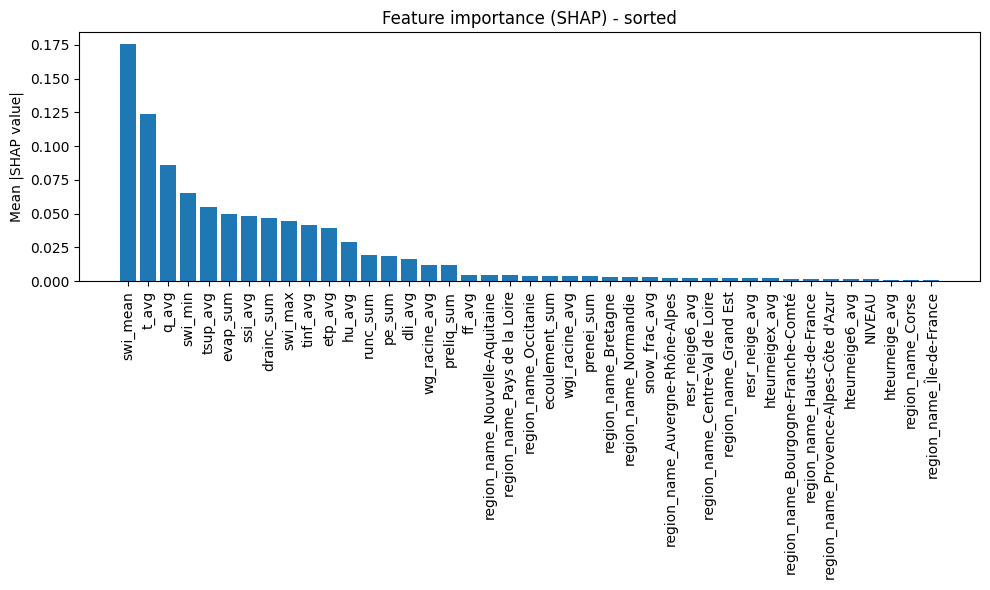

In [19]:
import numpy as np
import matplotlib.pyplot as plt

feature_names = (
    dyn_vars
    + ['NIVEAU']
    + list(ohe.get_feature_names_out(['region_name']))
)


# Valeurs SHAP déjà corrigées
shap_abs_mean = np.mean(np.abs(shap_values), axis=0)

# Indices pour tri décroissant
sorted_idx = np.argsort(shap_abs_mean)[::-1]  # du plus important au moins important

# Features et valeurs triées
sorted_features = np.array(feature_names)[sorted_idx]
sorted_shap = shap_abs_mean[sorted_idx]

# Plot vertical trié
plt.figure(figsize=(10, 6))
plt.bar(sorted_features, sorted_shap)
plt.xticks(rotation=90)
plt.ylabel("Mean |SHAP value|")
plt.title("Feature importance (SHAP) - sorted")
plt.tight_layout()
plt.show()


/tmp/ipykernel_1690/280668572.py:1: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(


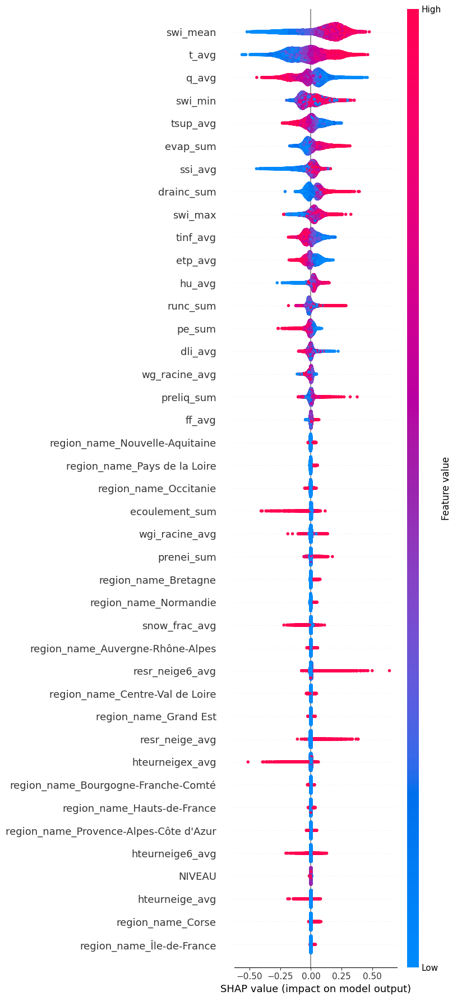

In [20]:
shap.summary_plot(
    shap_values,
    X_test.cpu().numpy(),
    feature_names=feature_names,
    plot_type="dot",
    max_display=50
)


In [ ]:
import geopandas as gpd
import pandas as pd
import numpy as np

# Filter 2024 data
gdf_2024 = gpd.GeoDataFrame(final_data[final_data['ym'].str.startswith('2024')].copy())

# Prepare features (dynamic + static) for the model
X_dyn_2024 = X_dyn_test  # or whatever you used for 2024 dynamic variables
X_stat_2024 = X_stat_test  # static variables for these rows

# Make predictions with your trained model
import torch

model.eval()
with torch.no_grad():
    X_dyn_t = torch.tensor(X_dyn_2024, dtype=torch.float32).to(device)
    X_stat_t = torch.tensor(X_stat_2024, dtype=torch.float32).to(device)
    y_pred_2024 = model(X_dyn_t, X_stat_t).cpu().numpy().flatten()  # flatten to 1D

# Add predictions and errors to the GeoDataFrame
gdf_2024['y_pred'] = y_pred_2024
gdf_2024['error'] = np.abs(gdf_2024['y_pred'] - gdf_2024['SWI_UNIF_MENS'])


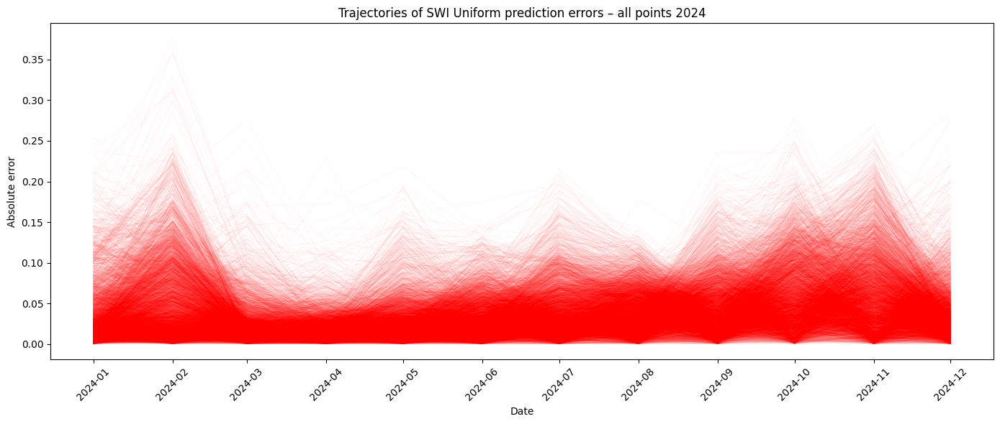

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# Filtrer uniquement 2024
df_2024 = final_data[final_data['ym'].str.startswith('2024')].copy()


import torch
import numpy as np

# Filtrer 2024
df_2024 = final_data[final_data['ym'].str.startswith('2024')].copy()

# Préparer les features pour le modèle
# X_dyn_2024 et X_stat_2024 doivent correspondre aux colonnes utilisées pour le modèle
X_dyn_2024 = X_dyn_test  # ou reconstruire dynamiques depuis df_2024
X_stat_2024 = X_stat_test  # idem pour statiques

# Prédictions
model.eval()
with torch.no_grad():
    X_dyn_t = torch.tensor(X_dyn_2024, dtype=torch.float32).to(device)
    X_stat_t = torch.tensor(X_stat_2024, dtype=torch.float32).to(device)
    y_pred_2024 = model(X_dyn_t, X_stat_t).cpu().numpy().flatten()

# Ajouter y_pred et erreur
df_2024['y_pred'] = y_pred_2024
df_2024['error'] = np.abs(df_2024['y_pred'] - df_2024['SWI_UNIF_MENS'])

# Conversion de la colonne ym en datetime
df_2024['ym_dt'] = pd.to_datetime(df_2024['ym'], format="%Y-%m")

fig, ax = plt.subplots(figsize=(14, 6))

# Trajectoire des erreurs pour chaque point géométrique
for _, g in df_2024.groupby("geometry"):
    ax.plot(
        g["ym_dt"],
        np.abs(g["y_pred"] - g["SWI_UNIF_MENS"]),  # trace l'erreur
        linewidth=0.5,
        alpha=0.05,  # transparence pour visualiser la densité
        color='red'
    )

# Tous les mois visibles
ax.xaxis.set_major_locator(mdates.MonthLocator())  # tous les mois
ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))

ax.set_xlabel("Date")
ax.set_ylabel("Absolute error")
ax.set_title("Trajectories of SWI Uniform prediction errors – all points 2024")

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
import torch
import numpy as np
import pandas as pd
import geopandas as gpd

# Filtrer 2024
df_2024 = final_data[final_data['ym'].str.startswith('2024')].copy()

# Préparer tes features dynamiques et statiques comme pour le test
# Exemple :
# X_dyn_2024 = df_2024[dyn_vars].values
# X_stat_2024 = df_2024[stat_vars].values
X_dyn_2024 = X_dyn_test  # remplacer par la vraie extraction depuis df_2024
X_stat_2024 = X_stat_test  # idem

# Prédiction avec le modèle
model.eval()
with torch.no_grad():
    X_dyn_t = torch.tensor(X_dyn_2024, dtype=torch.float32).to(device)
    X_stat_t = torch.tensor(X_stat_2024, dtype=torch.float32).to(device)
    y_pred_2024 = model(X_dyn_t, X_stat_t).cpu().numpy().flatten()

# Ajouter y_pred et erreur
df_2024['y_pred'] = y_pred_2024
df_2024['error'] = np.abs(df_2024['y_pred'] - df_2024['SWI_UNIF_MENS'])

# Ajouter trimestre
def assign_quarter(ym):
    month = int(ym.split('-')[1])
    if month <= 3:
        return 'T1'
    elif month <= 6:
        return 'T2'
    elif month <= 9:
        return 'T3'
    else:
        return 'T4'

df_2024['quarter'] = df_2024['ym'].apply(assign_quarter)

# Agréger par geometry et trimestre
gdf_quarter = df_2024.groupby(['geometry','region_name','quarter']).agg(
    error_mean=('error', 'mean')
).reset_index()

# Transformer en GeoDataFrame
gdf_quarter = gpd.GeoDataFrame(gdf_quarter, geometry='geometry')


In [ ]:
# T1
gdf_T1 = gdf_quarter[gdf_quarter['quarter'] == 'T1']
gdf_T1.explore(
    column='error_mean',
    cmap='Reds',
    legend=True,
    tooltip=['error_mean'],
    marker_kwds={'radius': 5},
    popup_on_click=True
)




In [ ]:
q75_T1 = gdf_T1["error_mean"].quantile(0.75)
print("75th percentile (T1):", q75_T1)

gdf_T1_high = gdf_T1[gdf_T1["error_mean"] > q75_T1]

gdf_T1_high.explore(
    column="error_mean",
    cmap="Reds",
    legend=True,
    tooltip=["error_mean", "region_name"],
    marker_kwds={"radius": 6},
    popup_on_click=True
)


75th percentile (T1): 0.049988479852676335


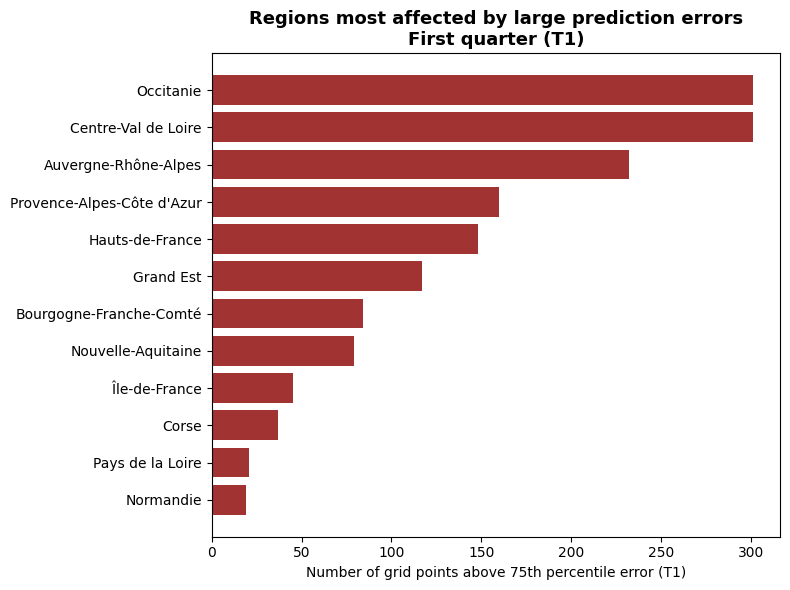

In [ ]:
region_counts_T1 = (
    gdf_T1_high["region_name"]
    .value_counts()
    .sort_values(ascending=True)  # important pour barh
)

import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))

plt.barh(
    region_counts_T1.index,
    region_counts_T1.values,
    color="#8b0000",
    alpha=0.8
)

plt.xlabel("Number of grid points above 75th percentile error (T1)")
plt.title(
    "Regions most affected by large prediction errors\nFirst quarter (T1)",
    fontsize=13,
    weight="bold"
)

plt.tight_layout()
plt.show()


In [ ]:
# T2
gdf_T2 = gdf_quarter[gdf_quarter['quarter'] == 'T2']
gdf_T2.explore(
    column='error_mean',
    cmap='Reds',
    legend=True,
    tooltip=['error_mean'],
    marker_kwds={'radius': 5},
    popup_on_click=True
)



In [ ]:
q75_T2 = gdf_T2["error_mean"].quantile(0.75)
print("75th percentile (T2):", q75_T2)

gdf_T2_high = gdf_T2[gdf_T2["error_mean"] > q75_T2]

gdf_T2_high.explore(
    column="error_mean",
    cmap="Reds",
    legend=True,
    tooltip=["error_mean", "region_name"],
    marker_kwds={"radius": 6},
    popup_on_click=True
)


75th percentile (T2): 0.03301574178536733


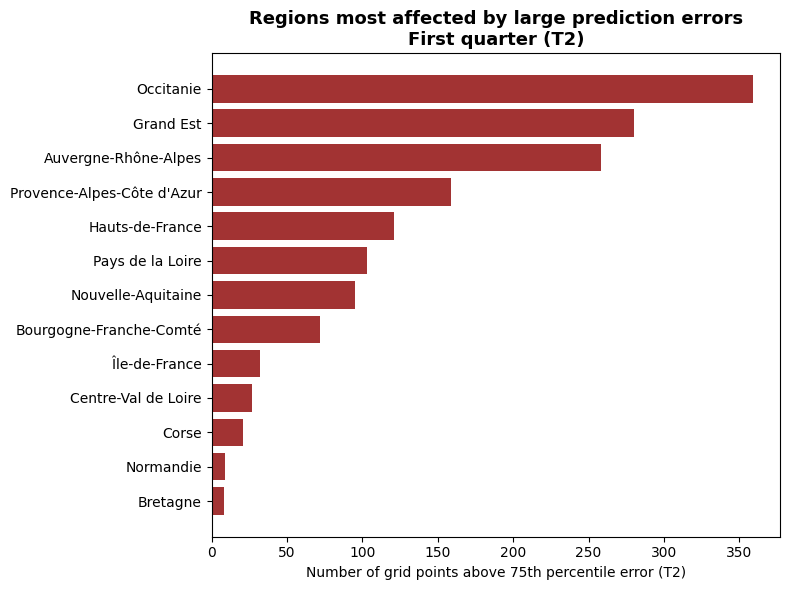

In [ ]:
region_counts_T2 = (
    gdf_T2_high["region_name"]
    .value_counts()
    .sort_values(ascending=True)  # important pour barh
)

import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))

plt.barh(
    region_counts_T2.index,
    region_counts_T2.values,
    color="#8b0000",
    alpha=0.8
)

plt.xlabel("Number of grid points above 75th percentile error (T2)")
plt.title(
    "Regions most affected by large prediction errors\nSecond quarter (T2)",
    fontsize=13,
    weight="bold"
)

plt.tight_layout()
plt.show()


In [ ]:
# T3
gdf_T3 = gdf_quarter[gdf_quarter['quarter'] == 'T3']
gdf_T3.explore(
    column='error_mean',
    cmap='Reds',
    legend=True,
    tooltip=['error_mean'],
    marker_kwds={'radius': 5},
    popup_on_click=True
)



In [ ]:
q75_T3 = gdf_T3["error_mean"].quantile(0.75)
print("75th percentile (T3):", q75_T3)

gdf_T3_high = gdf_T3[gdf_T3["error_mean"] > q75_T3]

gdf_T3_high.explore(
    column="error_mean",
    cmap="Reds",
    legend=True,
    tooltip=["error_mean", "region_name"],
    marker_kwds={"radius": 6},
    popup_on_click=True
)


75th percentile (T3): 0.05330757147073746


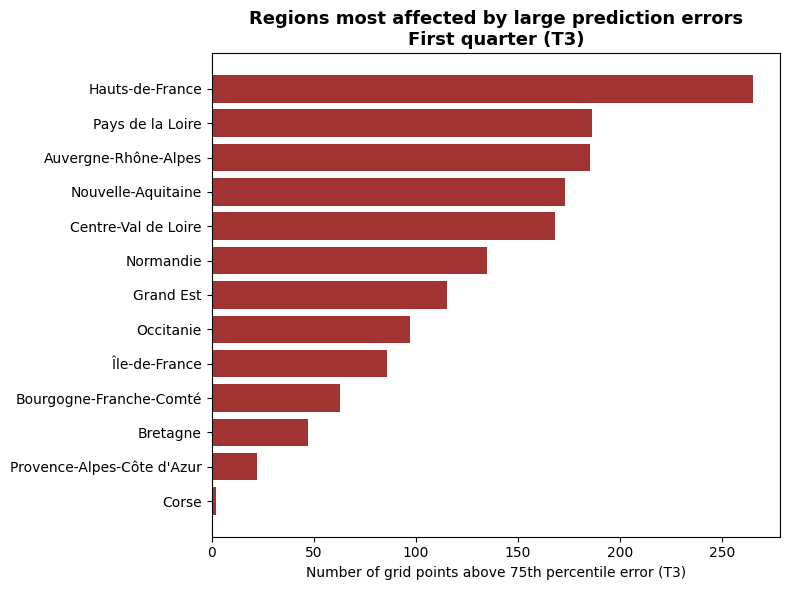

In [ ]:
region_counts_T3 = (
    gdf_T3_high["region_name"]
    .value_counts()
    .sort_values(ascending=True)  # important pour barh
)

import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))

plt.barh(
    region_counts_T3.index,
    region_counts_T3.values,
    color="#8b0000",
    alpha=0.8
)

plt.xlabel("Number of grid points above 75th percentile error (T3)")
plt.title(
    "Regions most affected by large prediction errors\nThird quarter (T3)",
    fontsize=13,
    weight="bold"
)

plt.tight_layout()
plt.show()


In [ ]:
# T4
gdf_T4 = gdf_quarter[gdf_quarter['quarter'] == 'T4']
gdf_T4.explore(
    column='error_mean',
    cmap='Reds',
    legend=True,
    tooltip=['error_mean'],
    marker_kwds={'radius': 5},
    popup_on_click=True
)

In [ ]:
q75_T4 = gdf_T4["error_mean"].quantile(0.75)
print("75th percentile (T4):", q75_T4)

gdf_T4_high = gdf_T4[gdf_T4["error_mean"] > q75_T4]

gdf_T4_high.explore(
    column="error_mean",
    cmap="Reds",
    legend=True,
    tooltip=["error_mean", "region_name"],
    marker_kwds={"radius": 6},
    popup_on_click=True
)


75th percentile (T4): 0.06836849562327067


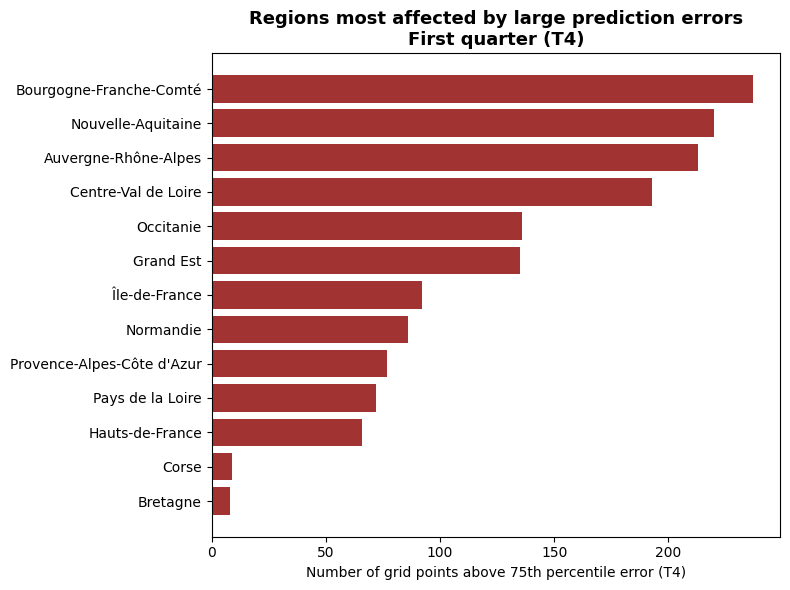

In [ ]:
region_counts_T4 = (
    gdf_T4_high["region_name"]
    .value_counts()
    .sort_values(ascending=True)  # important pour barh
)

import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))

plt.barh(
    region_counts_T4.index,
    region_counts_T4.values,
    color="#8b0000",
    alpha=0.8
)

plt.xlabel("Number of grid points above 75th percentile error (T4)")
plt.title(
    "Regions most affected by large prediction errors\nFourth quarter (T4)",
    fontsize=13,
    weight="bold"
)

plt.tight_layout()
plt.show()
